<a href="https://colab.research.google.com/github/SimonDelgado/Procesamiento-Digital-Multimedia/blob/main/Proyecto%201/Proyecto_1_DelgadoSimon_202840051.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1><center>

</center></h1>
<font size="6"><center>
EIE 401
PROCESAMIENTO DIGITAL MULTIMEDIA
</center></font>


<center><h2>Proyecto 1</h2></center>
<center><h3>Procesamiento digital de señales</h3></center>
<center><h3>Profesor: Jorge Cardenas</h3></center>

<center><h3>Por: Simón Delgado</h3></center>
<center><h5>Pontificia Universidad Catolica de Valparaiso</h5></center>


In [86]:
from IPython.display import IFrame, display
filepath = "Proyecto_1_EIE401.pdf"
IFrame(filepath, width=700, height=400)

Debes usar el sitio https://gwosc.org/eventapi/html/GWTC/, donde encuentras todo el catálogo de observaciones con los datos en diferentes formatos. Debes seleccionar una detección para tu estudio y descargar los datos correspondientes (H5 o TXT), lo que posteriormente deberás tratar de manera digital como audio (serie de tiempo).
tip: Te recomiendo tomar la serie de tiempo corta (32 segundos) para facilitar el análisis, y asegurarte de tomar la tasa de muestreo más alta.
tip: Asegúrate de tomar un caso cuyo espectrograma de muestra, indique una señal clara y fuerte para facilitar tu trabajo, de otra forma es posible que no logres aislarla lo suficiente.


In [87]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio
import scipy.signal as sig
from scipy.signal import butter, filtfilt, resample

## 1. Carga de Datos


In [88]:
import gzip
import shutil

ruta_archivo_comprimido = '/content/H-H1_GWOSC_16KHZ_R1-1126259447-32.txt.gz'

ruta_archivo_descomprimido = 'archivo_descomprimido3.txt'

with gzip.open(ruta_archivo_comprimido, 'rb') as archivo_comprimido:
  with open(ruta_archivo_descomprimido, 'wb') as archivo_descomprimido:
    shutil.copyfileobj(archivo_comprimido, archivo_descomprimido)

In [89]:
with open('archivo_descomprimido3.txt', 'r') as archivo:
  archivo_string = archivo.read()

In [90]:
ruta_archivo = 'archivo_descomprimido3.txt'

señal = np.loadtxt(ruta_archivo, delimiter=',', skiprows=1, dtype=float)
señal

array([6.09513456e-21, 1.48369999e-20, 2.28723129e-20, ...,
       6.18140599e-20, 1.01283600e-19, 1.20014866e-19])

In [91]:
fs = 16384 # información contenida en el archivo de texto
M = señal.size # muestras totales

Text(0, 0.5, 'Amplitud')

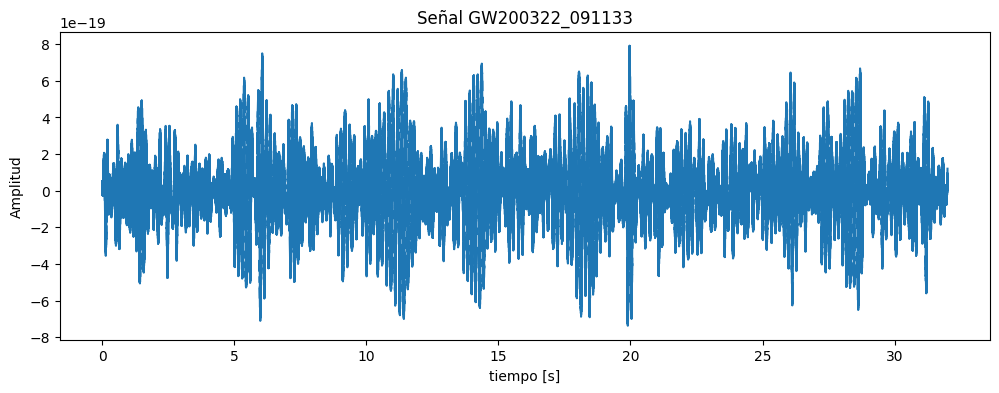

In [92]:
t = np.arange(0, M / fs, 1 / fs)

plt.figure(figsize=(12,4))
plt.title('Señal GW200322_091133')
plt.plot(t, señal)
plt.xlabel('tiempo [s]')
plt.ylabel('Amplitud')

/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'Amplitud')

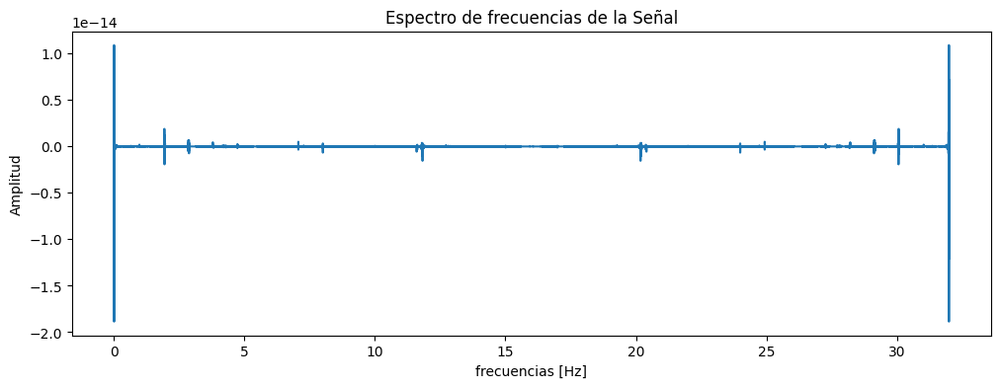

In [93]:
plt.figure(figsize=(12,4))
plt.plot(t, np.fft.fft(señal)) # transformada de Fourier
plt.title('Espectro de frecuencias de la Señal')
plt.xlabel('frecuencias [Hz]')
plt.ylabel('Amplitud')

## 2. Convertir en audio
Es una forma de validar que tenemos un alto componente de ruido en la señal y que el interés es eliminarlo para encontrar una señal candidata.

Te recomiendo hacer una señal de audio de cada uno de las etapas para así validar como va el proceso. Al final deberás obtener un señal con CHIRP o BUMP. Son sonidos que comprueban que tienes una cantidad de potencia que sobre destaca sobre el ruido.

In [94]:
Audio(señal, rate=fs)

## 3. Análisis de Fourier
Al realizar la conversión, queremos ver cuales son las componentes de ruido que más afectan al instrumento y debemos ignorar en el análisis. Eso se ve como "pico" o la apariencia de "peine".
Se debe presenta la densidad espectral de potencia antes y después de la función de Windowing.


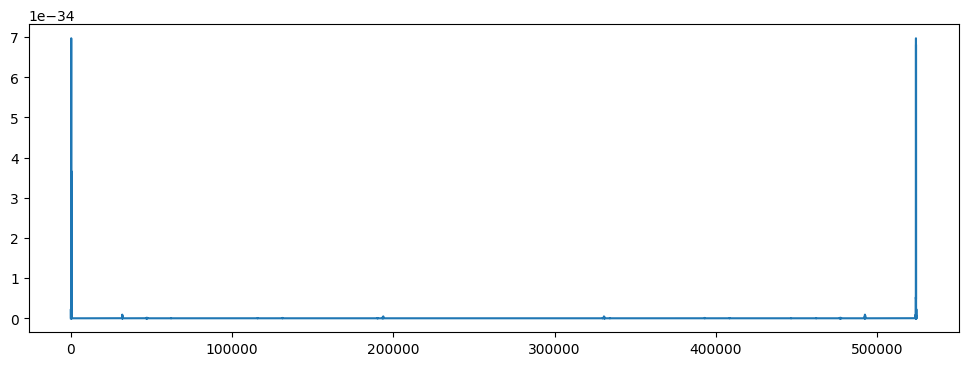

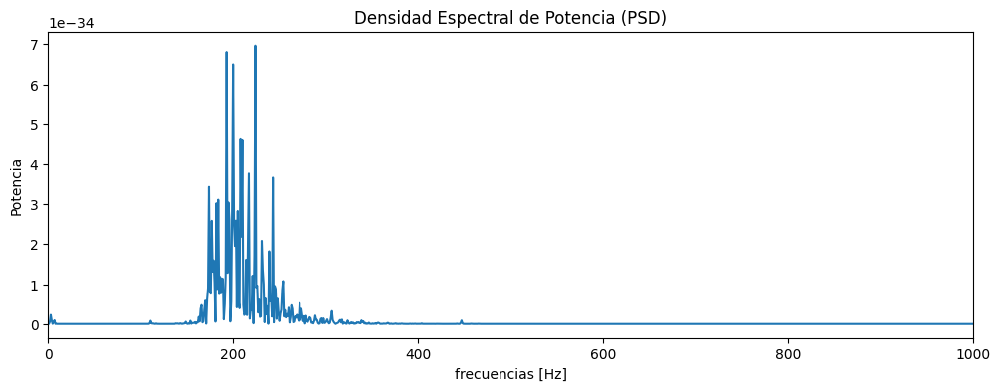

In [95]:
ft_señal = np.fft.fft(señal, M)
PSD = ft_señal * np.conj(ft_señal) / M # densidad espectral de potencia
plt.figure(figsize=(12,4))
plt.plot(PSD)
plt.show()
plt.figure(figsize=(12,4))
plt.plot(PSD)
plt.xlim(0, 1000)
plt.title('Densidad Espectral de Potencia (PSD)')
plt.xlabel('frecuencias [Hz]')
plt.ylabel('Potencia')
plt.show()

Text(0, 0.5, 'Amplitud')

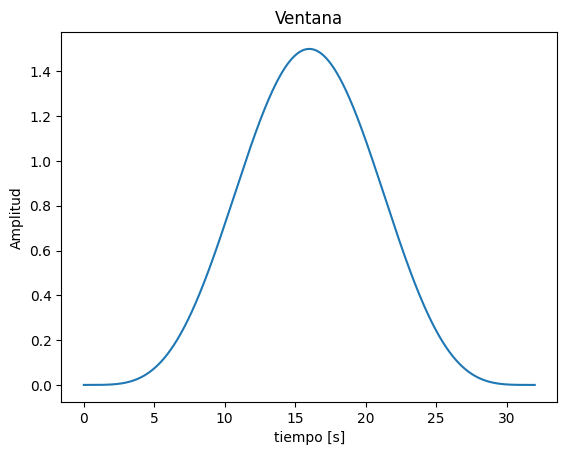

In [96]:
alpha = 0.5
window = np.hanning(M) # ventana Hann
tukey_window = window * (1 - alpha/2 - (1 - alpha/2) * np.cos(2 * np.pi * np.arange(M) / (M - 1))) # ventana Tukey es una ventana Hann que se multiplica por un cierto parámetro para hacerla más "cuadrada"
plt.plot(t, tukey_window)
plt.title('Ventana')
plt.xlabel('tiempo [s]')
plt.ylabel('Amplitud')

Text(0, 0.5, 'Amplitud')

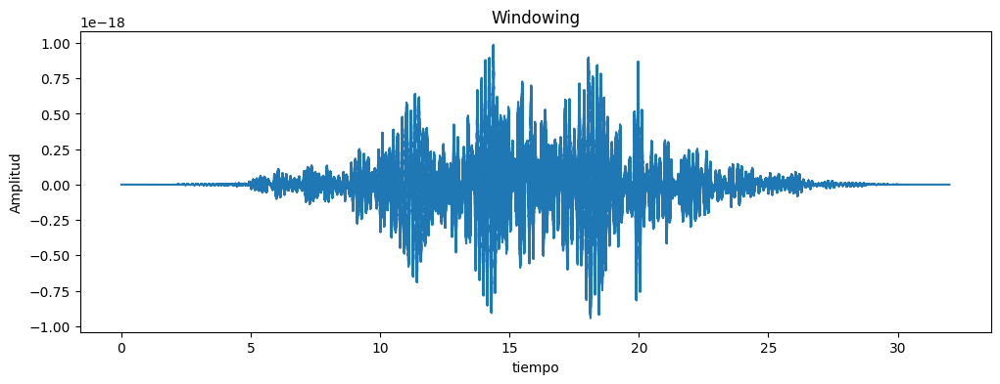

In [97]:
señal_windowed = tukey_window * señal # Windowing
plt.figure(figsize=(12,4))
plt.plot(t, señal_windowed)
plt.title('Windowing')
plt.xlabel('tiempo')
plt.ylabel('Amplitud')

(0.0, 500.0)

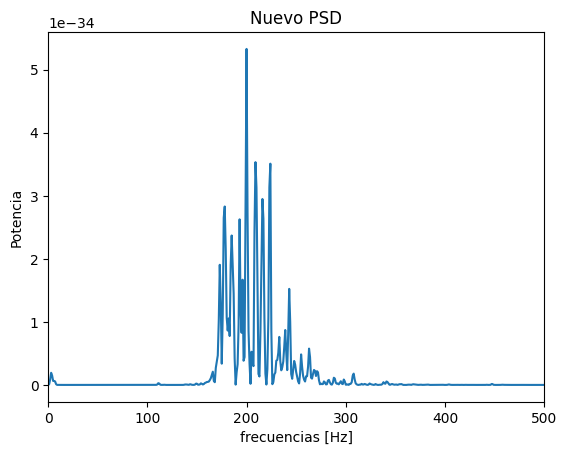

In [98]:
N = len(señal_windowed)
ft_señal_windowed = np.fft.fft(señal_windowed, N)
PSD_win = ft_señal_windowed * np.conj(ft_señal_windowed) / N
plt.plot(PSD_win)
plt.title('Nuevo PSD')
plt.xlabel('frecuencias [Hz]')
plt.ylabel('Potencia')
plt.xlim(0, 500)

## 4. Procesamiento
Debes inferir de tu estudio, cual es el proceso que aplican a la señal y reproducirlo. Es posible que cada estudiante llegue a una solución más o menos diferente, pues no hay un código abierto donde esté el procedimiento completo.


Text(0, 0.5, 'Amplitud')

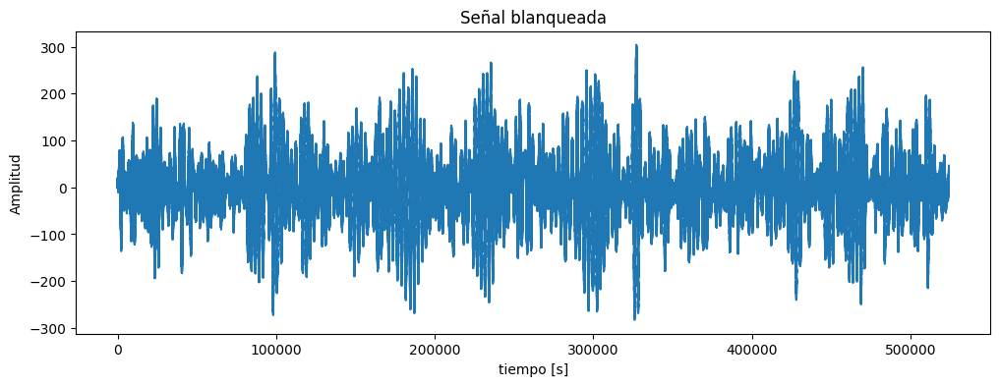

In [99]:
# se renombra "d" a la señal original

d = señal

# se aplica la fft

d_fft = np.fft.fft(d)

# se genera el whitening utilizando el Welch average

alpha = 0.5
window = np.hanning(4*fs)
tukey_window = window * (1 - alpha/2 - (1 - alpha/2) * np.cos(2 * np.pi * np.arange(window.size) / (window.size - 1)))

fw, Pxx = sig.welch(d, fs=fs, window=tukey_window, nperseg=4*fs, nfft=1024*fs)


Sn = np.average(Pxx) # promedio de la densidad espectral de potencia del ruido

dw_fft = d_fft / np.sqrt(Sn) # blanqueamiento

# se invierte al dominio del tiempo

dw = np.fft.ifft(dw_fft)


plt.figure(figsize=(12,4))
plt.title('Señal blanqueada')
plt.plot(dw)
plt.xlabel('tiempo [s]')
plt.ylabel('Amplitud')

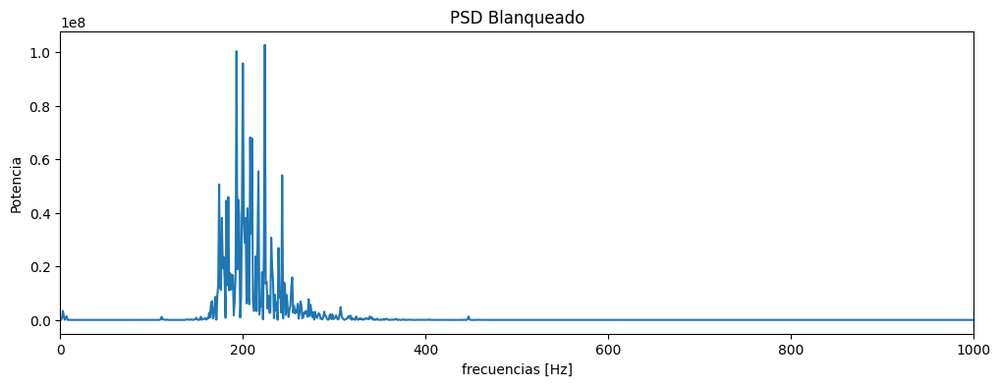

In [100]:
N = len(dw)
ft_señal_windowed = np.fft.fft(dw, N)
PSD_dw = ft_señal_windowed * np.conj(ft_señal_windowed) / N
plt.figure(figsize=(12,4))
plt.plot(PSD_dw)
plt.xlim(0, 1000)
plt.title('PSD Blanqueado')
plt.xlabel('frecuencias [Hz]')
plt.ylabel('Potencia')
plt.show()

Text(0, 0.5, 'Pxx')

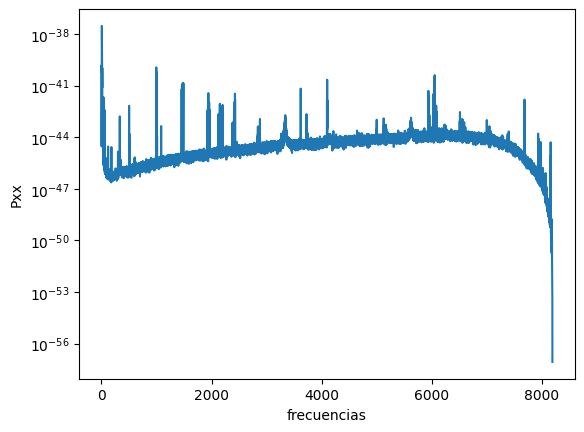

In [101]:
plt.semilogy(fw, Pxx)
plt.title('')
plt.xlabel('frecuencias')
plt.ylabel('Pxx')

In [102]:
Audio(dw, rate=fs)

/usr/local/lib/python3.10/dist-packages/IPython/lib/display.py:159: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


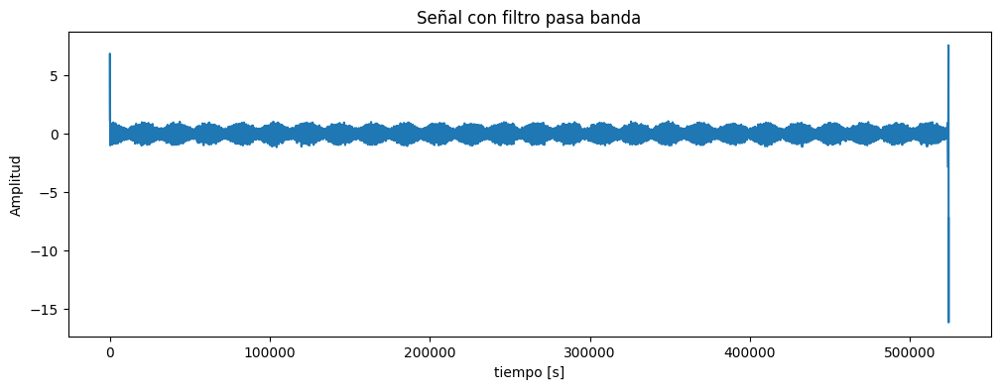

In [103]:
# aplicación de filtro pasa bandas entre 35 y 350 [Hz]

filter_order = 3
lowcut = 35 # lowcut y highcut están en "Hz"
highcut = 350

b, a = butter(filter_order, [lowcut,highcut], btype='bandpass', output='ba', fs=fs) # coeficientes del filtro

dw_filtered = filtfilt(b, a, dw) # filtrado

plt.figure(figsize=(12,4))
plt.title('Señal con filtro pasa banda')
plt.plot(dw_filtered)
plt.ylabel('Amplitud')
plt.xlabel('tiempo [s]')
plt.grid(False)

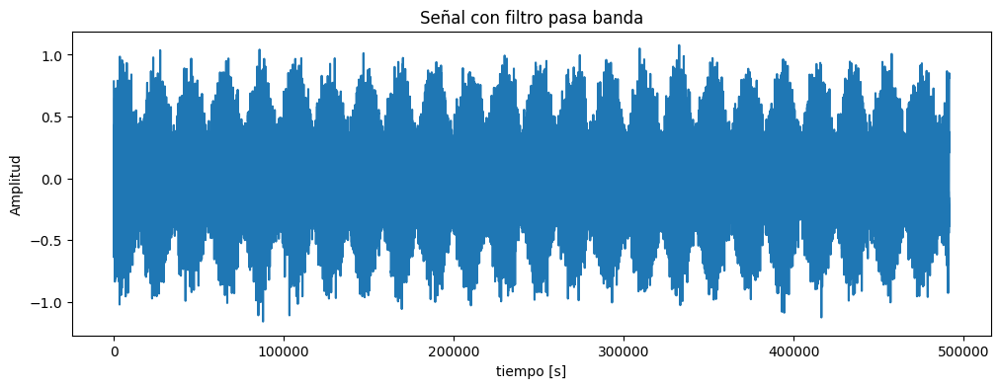

In [104]:
plt.figure(figsize=(12,4))
plt.title('Señal con filtro pasa banda')
plt.plot(dw_filtered[1*fs:31*fs])
plt.ylabel('Amplitud')
plt.xlabel('tiempo [s]')
plt.grid(False)

In [105]:
Audio(dw_filtered, rate=fs*8)

# Resampling
Para lograr una mejor definición de la señal, se debe hacer un resampleo. Esto tienen consecuencias por eso debe elegirse bien la frecuencia de tal forma que no se introduzca ruido.

Text(0, 0.5, 'Amplitud')

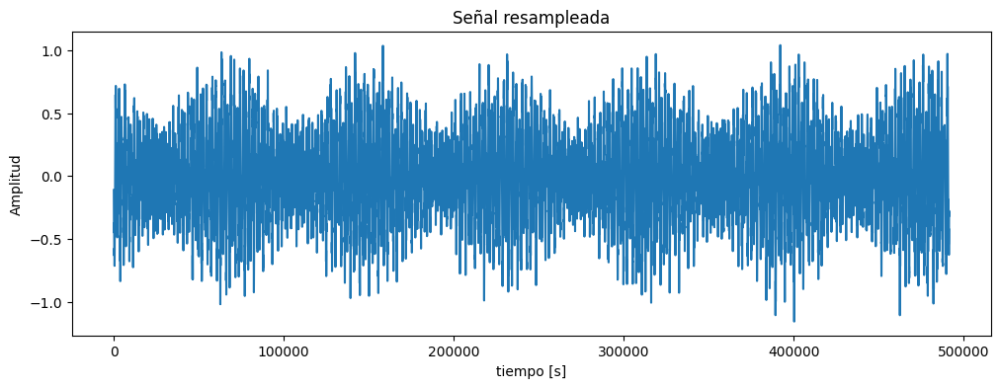

In [106]:
fs_new = 4*fs # nueva frecuencia de sampleo

numero_muestras = round(len(dw_filtered)* float(fs_new) / fs) # nuevo "M"
data = sig.resample(dw_filtered, numero_muestras) # señal resampleada

plt.figure(figsize=(12,4))
plt.plot(data[1*fs:31*fs])
plt.title('Señal resampleada')
plt.xlabel('tiempo [s]')
plt.ylabel('Amplitud')

In [107]:
Audio(data, rate=8*fs_new) # se aprecia un pequeño bump